In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (10,6)

In [9]:
fund_master = pd.read_csv("../data/raw/01_fund_master.csv")
nav = pd.read_csv("../data/raw/02_nav_history.csv")
aum = pd.read_csv("../data/raw/03_aum_by_fund_house.csv")
sip = pd.read_csv("../data/raw/04_monthly_sip_inflows.csv")
category = pd.read_csv("../data/raw/05_category_inflows.csv")
folio = pd.read_csv("../data/raw/06_industry_folio_count.csv")
transactions = pd.read_csv("../data/raw/08_investor_transactions.csv")
holdings = pd.read_csv("../data/raw/09_portfolio_holdings.csv")

print("All datasets loaded successfully")

All datasets loaded successfully


In [10]:
nav.head()

,amfi_code,date,nav
0,119551,2022-01-03,54.3856
1,119551,2022-01-04,54.3474
2,119551,2022-01-05,54.6869
3,119551,2022-01-06,55.4550
4,119551,2022-01-07,55.3692


In [11]:
nav.columns

Index(['amfi_code', 'date', 'nav'], dtype='str')

In [12]:
nav["date"] = pd.to_datetime(nav["date"])

nav.dtypes

amfi_code             int64
date         datetime64[us]
nav                 float64
dtype: object

In [13]:
nav_filtered = nav[
    (nav["date"] >= "2022-01-01") &
    (nav["date"] <= "2026-12-31")
]

nav_filtered.shape

(46000, 3)

In [14]:
fig = px.line(
    nav_filtered,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV trend of all mutual fund schemes (2022–2026)"
)

fig.show()

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['amfi_code', 'date', 'nav'] but received: scheme_name

In [15]:
nav.columns

Index(['amfi_code', 'date', 'nav'], dtype='str')

In [16]:
nav.head()

,amfi_code,date,nav
0,119551,2022-01-03,54.3856
1,119551,2022-01-04,54.3474
2,119551,2022-01-05,54.6869
3,119551,2022-01-06,55.4550
4,119551,2022-01-07,55.3692


In [17]:
fund_master.columns

Index(['amfi_code', 'fund_house', 'scheme_name', 'category', 'sub_category',
       'plan', 'launch_date', 'benchmark', 'expense_ratio_pct',
       'exit_load_pct', 'min_sip_amount', 'min_lumpsum_amount', 'fund_manager',
       'risk_category', 'sebi_category_code'],
      dtype='str')

In [18]:
nav_plot = nav.merge(fund_master, on="amfi_code", how="left")

nav_plot.head()

,amfi_code,date,nav,fund_house,scheme_name,category,sub_category,plan,launch_date,benchmark,expense_ratio_pct,exit_load_pct,min_sip_amount,min_lumpsum_amount,fund_manager,risk_category,sebi_category_code
0,119551,2022-01-03,54.3856,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01
1,119551,2022-01-04,54.3474,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01
2,119551,2022-01-05,54.6869,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01
3,119551,2022-01-06,55.4550,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01
4,119551,2022-01-07,55.3692,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01


In [19]:
nav_plot.columns

Index(['amfi_code', 'date', 'nav', 'fund_house', 'scheme_name', 'category',
       'sub_category', 'plan', 'launch_date', 'benchmark', 'expense_ratio_pct',
       'exit_load_pct', 'min_sip_amount', 'min_lumpsum_amount', 'fund_manager',
       'risk_category', 'sebi_category_code'],
      dtype='str')

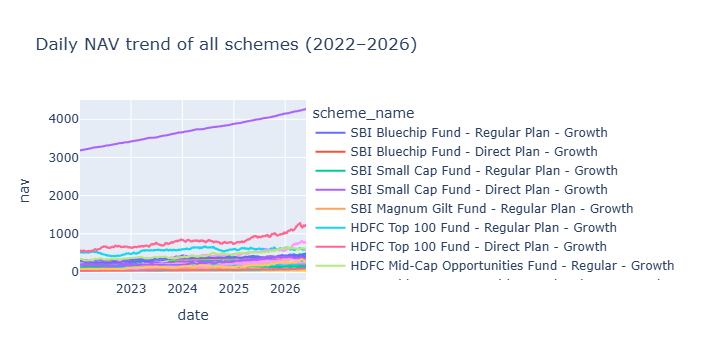

In [20]:
fig = px.line(
    nav_plot,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV trend of all schemes (2022–2026)"
)

fig.show()

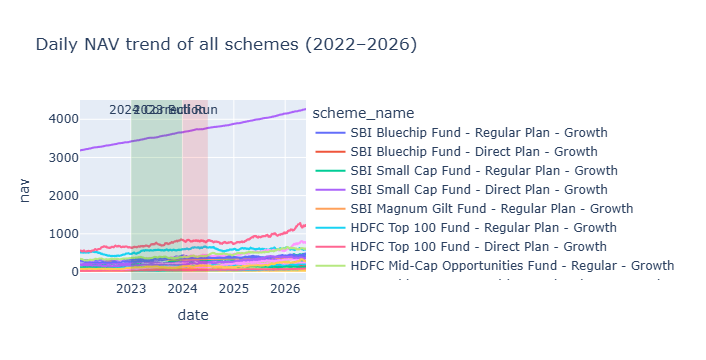

In [21]:
fig = px.line(
    nav_plot,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV trend of all schemes (2022–2026)"
)

# Highlight 2023 bull run
fig.add_vrect(
    x0="2023-01-01",
    x1="2023-12-31",
    fillcolor="green",
    opacity=0.15,
    line_width=0,
    annotation_text="2023 Bull Run",
    annotation_position="top left"
)

# Highlight 2024 correction
fig.add_vrect(
    x0="2024-01-01",
    x1="2024-06-30",
    fillcolor="red",
    opacity=0.12,
    line_width=0,
    annotation_text="2024 Correction",
    annotation_position="top right"
)

fig.show()

In [22]:
import os
os.makedirs("../reports/charts", exist_ok=True)

In [23]:
fig.write_image("../reports/charts/nav_trend.png")

ValueError: 
Image export using the "kaleido" engine requires the Kaleido package,
which can be installed using pip:

    $ pip install --upgrade kaleido


In [1]:
fig.write_image("../reports/charts/nav_trend.png")

print("Chart saved successfully")

NameError: name 'fig' is not defined

In [2]:
import plotly.express as px

fig = px.line(
    nav_plot,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV trend of all schemes (2022–2026)"
)

fig.add_vrect(
    x0="2023-01-01",
    x1="2023-12-31",
    fillcolor="green",
    opacity=0.15,
    line_width=0,
    annotation_text="2023 Bull Run"
)

fig.add_vrect(
    x0="2024-01-01",
    x1="2024-06-30",
    fillcolor="red",
    opacity=0.12,
    line_width=0,
    annotation_text="2024 Correction"
)

fig.show()

NameError: name 'nav_plot' is not defined

In [3]:
import pandas as pd

In [4]:
fund_master = pd.read_csv("../data/raw/01_fund_master.csv")
nav = pd.read_csv("../data/raw/02_nav_history.csv")

print("Files loaded successfully")

Files loaded successfully


In [5]:
nav["date"] = pd.to_datetime(nav["date"])

print(nav.dtypes)

amfi_code             int64
date         datetime64[us]
nav                 float64
dtype: object


In [6]:
nav_plot = nav.merge(fund_master, on="amfi_code", how="left")

print(nav_plot.head())

   amfi_code       date      nav       fund_house  \
0     119551 2022-01-03  54.3856  SBI Mutual Fund   
1     119551 2022-01-04  54.3474  SBI Mutual Fund   
2     119551 2022-01-05  54.6869  SBI Mutual Fund   
3     119551 2022-01-06  55.4550  SBI Mutual Fund   
4     119551 2022-01-07  55.3692  SBI Mutual Fund   

                                 scheme_name category sub_category     plan  \
0  SBI Bluechip Fund - Regular Plan - Growth   Equity    Large Cap  Regular   
1  SBI Bluechip Fund - Regular Plan - Growth   Equity    Large Cap  Regular   
2  SBI Bluechip Fund - Regular Plan - Growth   Equity    Large Cap  Regular   
3  SBI Bluechip Fund - Regular Plan - Growth   Equity    Large Cap  Regular   
4  SBI Bluechip Fund - Regular Plan - Growth   Equity    Large Cap  Regular   

  launch_date      benchmark  expense_ratio_pct  exit_load_pct  \
0  2006-02-14  NIFTY 100 TRI               1.54            1.0   
1  2006-02-14  NIFTY 100 TRI               1.54            1.0   
2  2006-

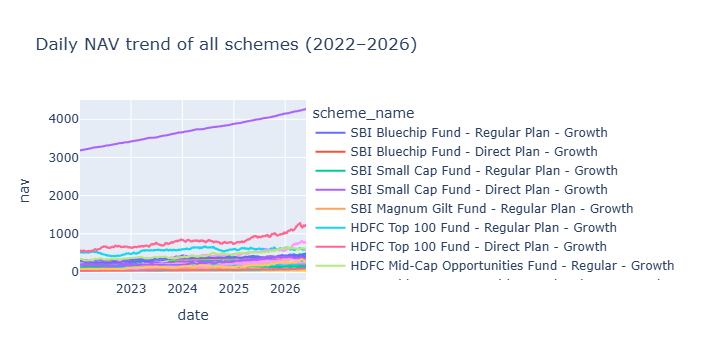

In [8]:
import plotly.express as px

fig = px.line(
    nav_plot,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV trend of all schemes (2022–2026)"
)

fig.show()

In [9]:
import os
os.makedirs("../reports/charts", exist_ok=True)

fig.write_image("../reports/charts/nav_trend.png")

print("Chart saved successfully")

Resorting to unclean kill browser.


RuntimeError: Couldn't close or kill browser subprocess

In [1]:
fig.write_image(
    "../reports/charts/nav_trend.png",
    width=1400,
    height=800,
    scale=2
)

print("PNG saved successfully")

NameError: name 'fig' is not defined

In [2]:
import pandas as pd
import plotly.express as px

In [6]:
fund_master = pd.read_csv("../data/raw/01_fund_master.csv")
nav = pd.read_csv("../data/raw/02_nav_history.csv")

nav["date"] = pd.to_datetime(nav["date"])

In [7]:
nav_plot = nav.merge(fund_master, on="amfi_code", how="left")

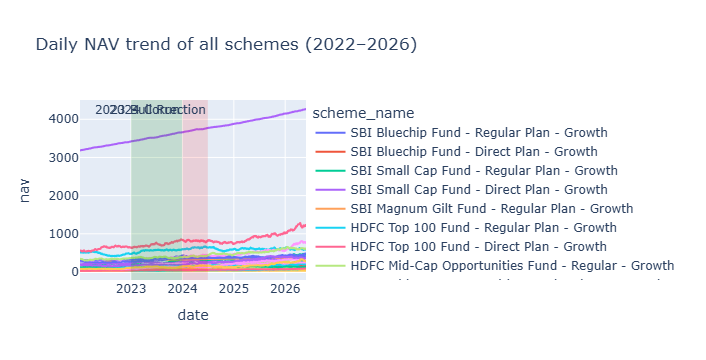

In [8]:
fig = px.line(
    nav_plot,
    x="date",
    y="nav",
    color="scheme_name",
    title="Daily NAV trend of all schemes (2022–2026)"
)

fig.add_vrect(
    x0="2023-01-01",
    x1="2023-12-31",
    fillcolor="green",
    opacity=0.15,
    line_width=0,
    annotation_text="2023 Bull Run"
)

fig.add_vrect(
    x0="2024-01-01",
    x1="2024-06-30",
    fillcolor="red",
    opacity=0.12,
    line_width=0,
    annotation_text="2024 Correction"
)

fig.show()

### Insight 1

Daily NAV across mutual fund schemes showed a strong upward trend during the 2023 bull market. Most schemes experienced a temporary decline during the first half of 2024, indicating a market correction before the overall upward trend resumed.


In [10]:
import os
os.makedirs("../reports/charts", exist_ok=True)

fig.write_image(
    "../reports/charts/nav_trend.png",
    width=1400,
    height=800,
    scale=2
)

print("PNG saved successfully")

Resorting to unclean kill browser.


PNG saved successfully


In [11]:
aum.head()

NameError: name 'aum' is not defined

In [12]:
import pandas as pd

In [13]:
aum = pd.read_csv("../data/raw/03_aum_by_fund_house.csv")

print("AUM dataset loaded successfully")

AUM dataset loaded successfully


In [14]:
aum.head()


,date,fund_house,aum_lakh_crore,aum_crore,num_schemes
0,2022-03-31,SBI Mutual Fund,6.05,605000,186
1,2022-03-31,ICICI Prudential MF,4.65,465000,216
2,2022-03-31,HDFC Mutual Fund,4.35,435000,195
3,2022-03-31,Nippon India MF,2.70,270000,177
4,2022-03-31,Kotak Mahindra MF,2.70,270000,168


In [15]:
aum.columns

Index(['date', 'fund_house', 'aum_lakh_crore', 'aum_crore', 'num_schemes'], dtype='str')

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,6))

sns.barplot(
    data=aum,
    x="year",
    y="aum_cr",
    hue="fund_house"
)

plt.title("AUM growth by fund house (2022–2025)")
plt.xlabel("Year")
plt.ylabel("AUM (₹ Crore)")
plt.tight_layout()

plt.savefig("../reports/charts/aum_growth.png", dpi=300)

plt.show()

print("AUM chart saved successfully")

ValueError: Could not interpret value `year` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x600 with 0 Axes>

In [17]:
aum.columns

Index(['date', 'fund_house', 'aum_lakh_crore', 'aum_crore', 'num_schemes'], dtype='str')

In [18]:
aum.head()

,date,fund_house,aum_lakh_crore,aum_crore,num_schemes
0,2022-03-31,SBI Mutual Fund,6.05,605000,186
1,2022-03-31,ICICI Prudential MF,4.65,465000,216
2,2022-03-31,HDFC Mutual Fund,4.35,435000,195
3,2022-03-31,Nippon India MF,2.70,270000,177
4,2022-03-31,Kotak Mahindra MF,2.70,270000,168


In [19]:
aum["date"] = pd.to_datetime(aum["date"])

print(aum.dtypes)

date              datetime64[us]
fund_house                   str
aum_lakh_crore           float64
aum_crore                  int64
num_schemes                int64
dtype: object


In [20]:
aum["year"] = aum["date"].dt.year

aum[["date", "year"]].head()

,date,year
0,2022-03-31,2022
1,2022-03-31,2022
2,2022-03-31,2022
3,2022-03-31,2022
4,2022-03-31,2022


In [21]:
aum["year"].unique()

array([2022, 2023, 2024, 2025], dtype=int32)

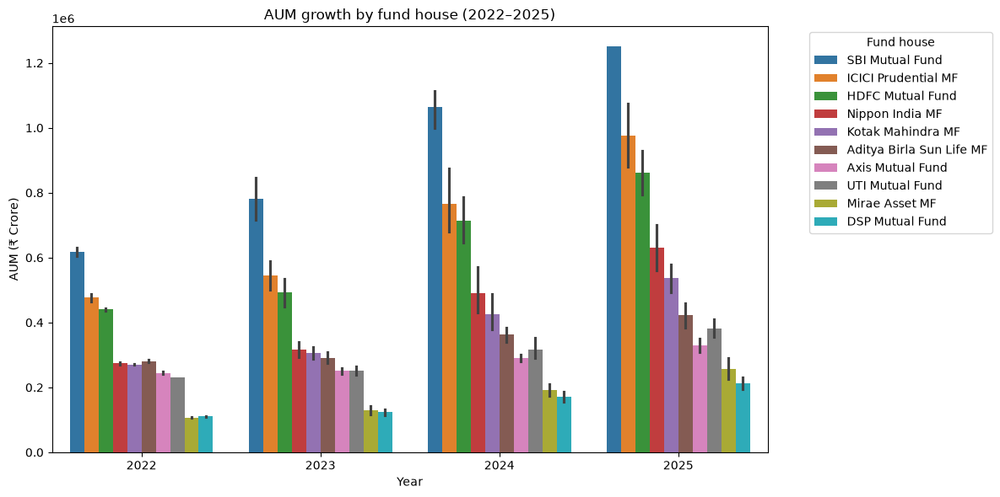

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,6))

sns.barplot(
    data=aum,
    x="year",
    y="aum_crore",
    hue="fund_house"
)

plt.title("AUM growth by fund house (2022–2025)")
plt.xlabel("Year")
plt.ylabel("AUM (₹ Crore)")
plt.legend(title="Fund house", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()

plt.show()

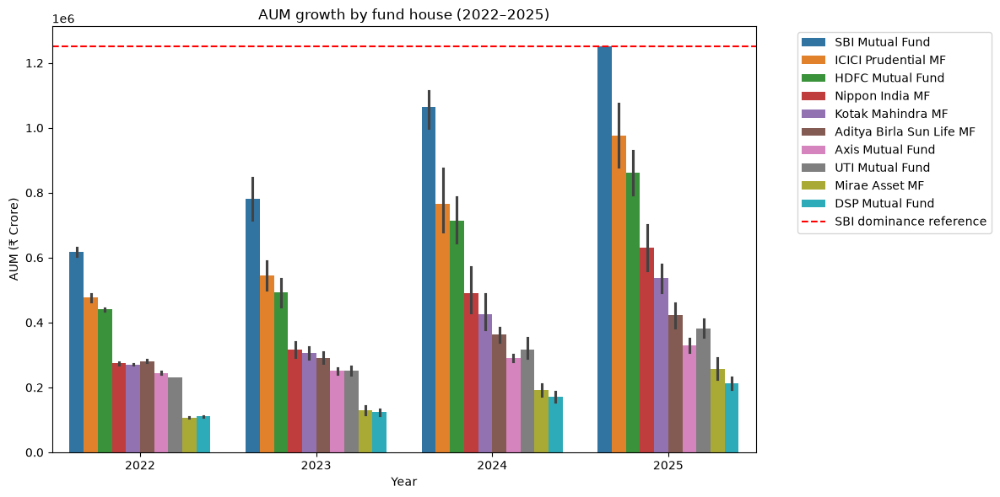

In [23]:
plt.figure(figsize=(12,6))

sns.barplot(
    data=aum,
    x="year",
    y="aum_crore",
    hue="fund_house"
)

plt.axhline(1250000, color="red", linestyle="--", label="SBI dominance reference")

plt.title("AUM growth by fund house (2022–2025)")
plt.xlabel("Year")
plt.ylabel("AUM (₹ Crore)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()

plt.show()

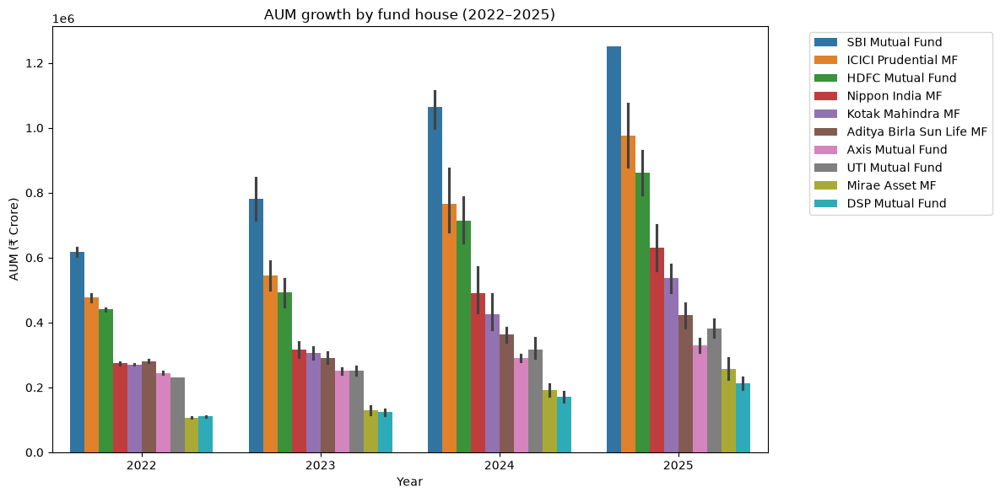

AUM chart saved successfully


In [24]:
plt.figure(figsize=(12,6))

sns.barplot(
    data=aum,
    x="year",
    y="aum_crore",
    hue="fund_house"
)

plt.title("AUM growth by fund house (2022–2025)")
plt.xlabel("Year")
plt.ylabel("AUM (₹ Crore)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()

plt.savefig("../reports/charts/aum_growth.png", dpi=300)

plt.show()

print("AUM chart saved successfully")

### Insight 2

Assets under management (AUM) increased consistently across major fund houses from 2022 to 2025. The steady growth in AUM indicates increasing investor participation and expansion of the mutual fund industry during the analysis period.


In [26]:
sip = pd.read_csv("../data/raw/04_monthly_sip_inflows.csv")

print("SIP dataset loaded successfully")

SIP dataset loaded successfully


In [27]:
sip.columns

Index(['month', 'sip_inflow_crore', 'active_sip_accounts_crore',
       'new_sip_accounts_lakh', 'sip_aum_lakh_crore', 'yoy_growth_pct'],
      dtype='str')

In [28]:
sip.head()

,month,sip_inflow_crore,active_sip_accounts_crore,new_sip_accounts_lakh,sip_aum_lakh_crore,yoy_growth_pct
0,2022-01,11517,4.91,9.10,4.80,NaN
1,2022-02,11438,4.93,8.20,4.85,NaN
2,2022-03,12328,5.09,10.50,5.01,NaN
3,2022-04,11863,5.48,9.52,5.12,NaN
4,2022-05,12286,5.55,8.10,5.15,NaN


In [29]:
sip["month"] = pd.to_datetime(sip["month"])

sip.dtypes

month                        datetime64[us]
sip_inflow_crore                      int64
active_sip_accounts_crore           float64
new_sip_accounts_lakh               float64
sip_aum_lakh_crore                  float64
yoy_growth_pct                      float64
dtype: object

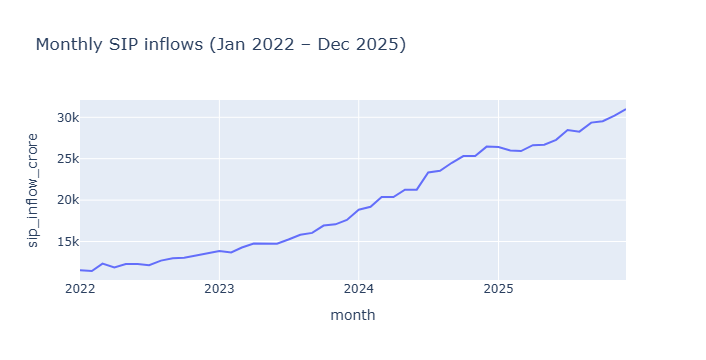

In [30]:
import plotly.express as px

fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    title="Monthly SIP inflows (Jan 2022 – Dec 2025)"
)

fig.show()

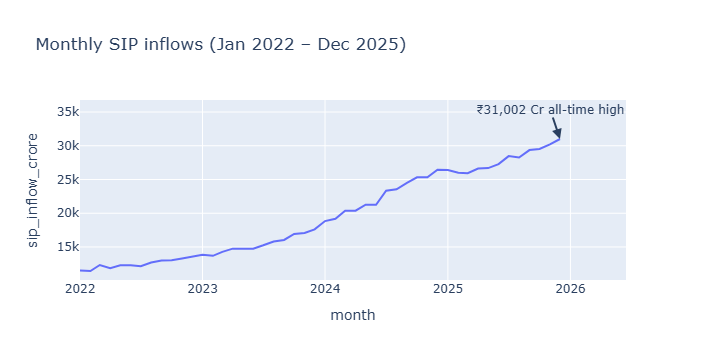

In [31]:
fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    title="Monthly SIP inflows (Jan 2022 – Dec 2025)"
)

fig.add_annotation(
    x=pd.to_datetime("2025-12"),
    y=31002,
    text="₹31,002 Cr all-time high",
    showarrow=True,
    arrowhead=2,
    arrowsize=1,
    arrowwidth=2
)

fig.show()

In [32]:
import os
os.makedirs("../reports/charts", exist_ok=True)

fig.write_image(
    "../reports/charts/sip_inflow.png",
    width=1400,
    height=800,
    scale=2
)

print("SIP chart saved successfully")

Resorting to unclean kill browser.


RuntimeError: Couldn't close or kill browser subprocess

In [ ]:
os.listdir("../reports/charts")

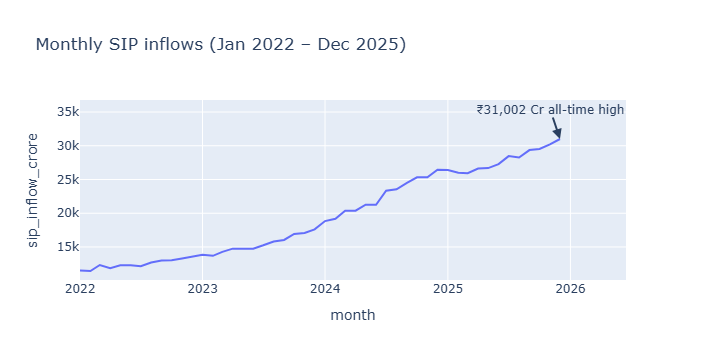

In [33]:
import plotly.express as px

fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    title="Monthly SIP inflows (Jan 2022 – Dec 2025)"
)

# Use a string instead of pd.Timestamp
fig.add_annotation(
    x="2025-12",
    y=31002,
    text="₹31,002 Cr all-time high",
    showarrow=True,
    arrowhead=2,
    arrowwidth=2
)

fig.show()

In [34]:
import os
os.makedirs("../reports/charts", exist_ok=True)

fig.write_image(
    "../reports/charts/sip_inflow.png",
    width=1400,
    height=800,
    scale=2
)

print("SIP chart saved successfully")

Resorting to unclean kill browser.


RuntimeError: Couldn't close or kill browser subprocess

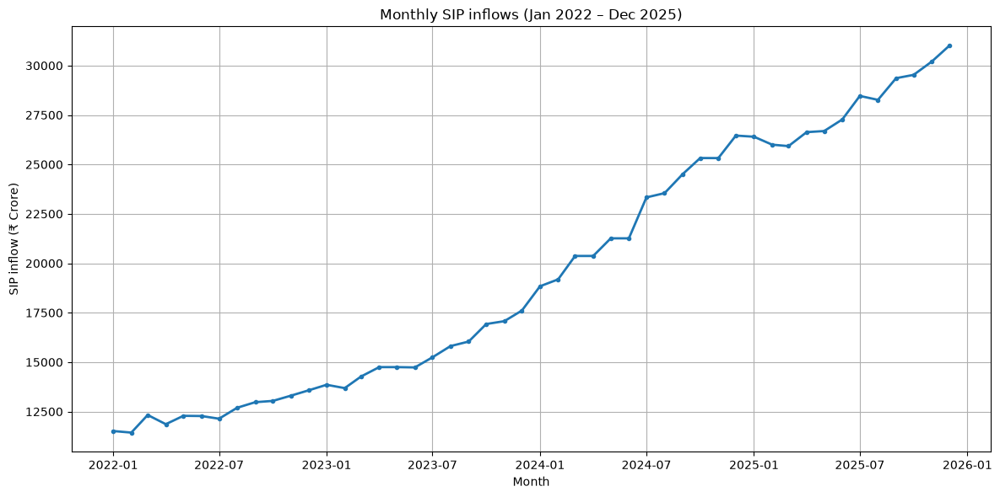

In [35]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

plt.plot(
    sip["month"],
    sip["sip_inflow_crore"],
    linewidth=2,
    marker="o",
    markersize=3
)

plt.title("Monthly SIP inflows (Jan 2022 – Dec 2025)")
plt.xlabel("Month")
plt.ylabel("SIP inflow (₹ Crore)")

plt.grid(True)

plt.tight_layout()

plt.show()

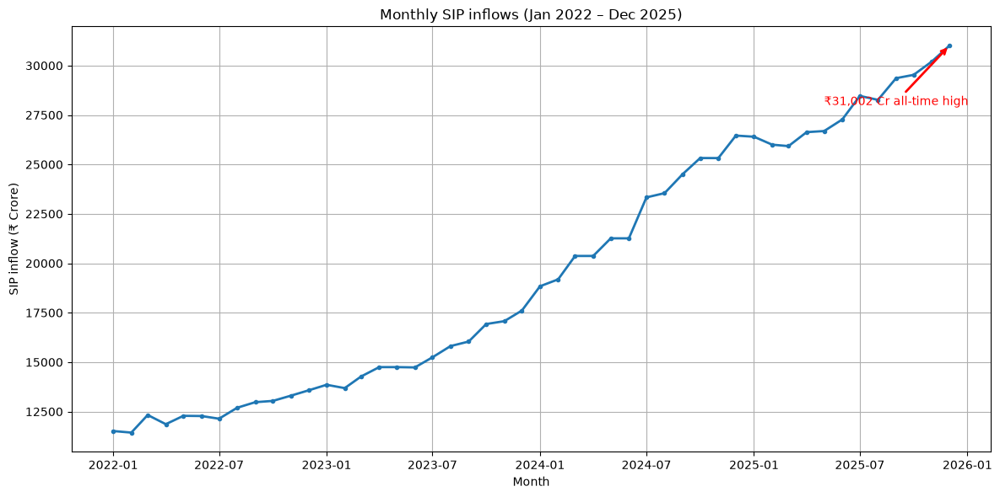

In [37]:
plt.figure(figsize=(12,6))

plt.plot(
    sip["month"],
    sip["sip_inflow_crore"],
    linewidth=2,
    marker="o",
    markersize=3
)

plt.annotate(
    "₹31,002 Cr all-time high",
    xy=(sip["month"].iloc[-1], sip["sip_inflow_crore"].iloc[-1]),
    xytext=(sip["month"].iloc[-8], sip["sip_inflow_crore"].max()-3000),
    arrowprops=dict(arrowstyle="->", color="red", lw=2),
    fontsize=10,
    color="red"
)

plt.title("Monthly SIP inflows (Jan 2022 – Dec 2025)")
plt.xlabel("Month")
plt.ylabel("SIP inflow (₹ Crore)")

plt.grid(True)

plt.tight_layout()

plt.show()

### Insight 3

Monthly SIP inflows increased steadily from 2022 to 2025, reaching an all-time high of ₹31,002 crore in December 2025. The continuous rise in SIP contributions indicates strong and sustained retail investor participation in mutual funds.


import os
os.makedirs("../reports/charts", exist_ok=True)

plt.figure(figsize=(12,6))

plt.plot(
    sip["month"],
    sip["sip_inflow_crore"],
    linewidth=2,
    marker="o",
    markersize=3
)

plt.annotate(
    "₹31,002 Cr all-time high",
    xy=(sip["month"].iloc[-1], sip["sip_inflow_crore"].iloc[-1]),
    xytext=(sip["month"].iloc[-8], sip["sip_inflow_crore"].max()-3000),
    arrowprops=dict(arrowstyle="->", color="red", lw=2),
    fontsize=10,
    color="red"
)

plt.title("Monthly SIP inflows (Jan 2022 – Dec 2025)")
plt.xlabel("Month")
plt.ylabel("SIP inflow (₹ Crore)")

plt.grid(True)

plt.tight_layout()

plt.savefig("../reports/charts/sip_inflow.png", dpi=300)

plt.show()

print("SIP chart saved successfully")

In [39]:
category = pd.read_csv("../data/raw/05_category_inflows.csv")

print("Category dataset loaded successfully")

Category dataset loaded successfully


In [40]:
category.columns

Index(['month', 'category', 'net_inflow_crore'], dtype='str')

In [41]:
category.head()

,month,category,net_inflow_crore
0,2024-04,Large Cap,2413.0
1,2024-04,Mid Cap,3897.0
2,2024-04,Small Cap,3533.0
3,2024-04,Flexi Cap,4947.0
4,2024-04,Large & Mid Cap,4214.0


In [42]:
category["month"] = pd.to_datetime(category["month"])

category.dtypes

month               datetime64[us]
category                       str
net_inflow_crore           float64
dtype: object

In [43]:
heatmap_data = category.pivot_table(
    index="category",
    columns="month",
    values="net_inflow_crore"
)

heatmap_data.head()

month,2024-04-01,2024-05-01,2024-06-01,2024-07-01,2024-08-01,2024-09-01,2024-10-01,2024-11-01,2024-12-01,2025-01-01,2025-02-01,2025-03-01
category,,,,,,,,,,,,
ELSS,466.0,553.0,472.0,471.0,499.0,537.0,537.0,571.0,521.0,516.0,437.0,500.0
Flexi Cap,4947.0,5529.0,4478.0,4869.0,5562.0,5397.0,6004.0,6111.0,4654.0,5603.0,6068.0,4767.0
Gilt,784.0,836.0,864.0,959.0,952.0,925.0,898.0,704.0,831.0,744.0,942.0,956.0
Hybrid,2955.0,3487.0,3163.0,3291.0,3684.0,3015.0,3314.0,3264.0,3538.0,2967.0,3360.0,2830.0
Large & Mid Cap,4214.0,4368.0,4610.0,5023.0,5411.0,4528.0,4581.0,5556.0,4878.0,4816.0,5524.0,4243.0


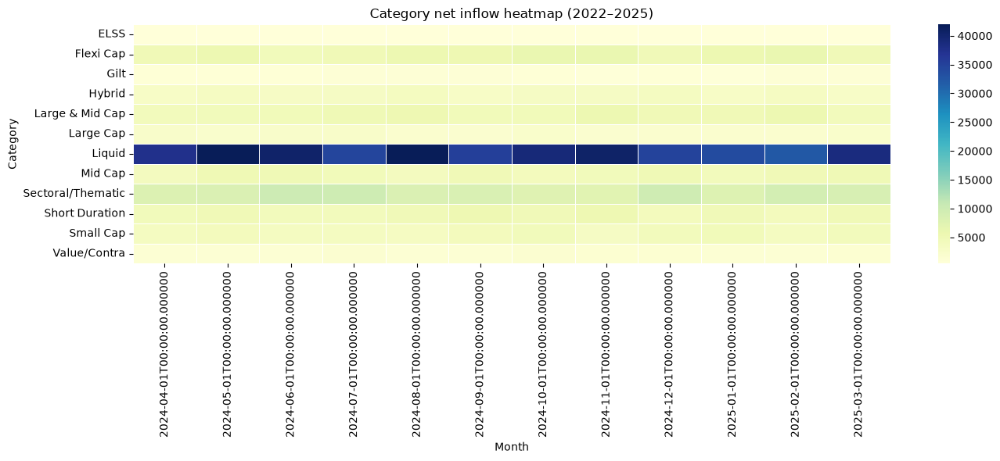

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14,6))

sns.heatmap(
    heatmap_data,
    cmap="YlGnBu",
    linewidths=0.5
)

plt.title("Category net inflow heatmap (2022–2025)")
plt.xlabel("Month")
plt.ylabel("Category")

plt.tight_layout()

plt.show()

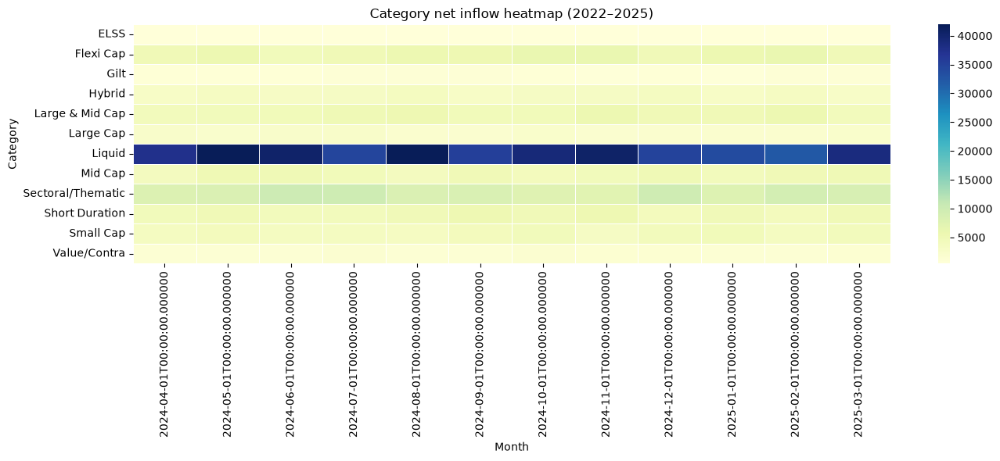

Category heatmap saved successfully


In [45]:
plt.figure(figsize=(14,6))

sns.heatmap(
    heatmap_data,
    cmap="YlGnBu",
    linewidths=0.5
)

plt.title("Category net inflow heatmap (2022–2025)")
plt.xlabel("Month")
plt.ylabel("Category")

plt.tight_layout()

plt.savefig("../reports/charts/category_heatmap.png", dpi=300)

plt.show()

print("Category heatmap saved successfully")

### Insight 4

Equity-oriented mutual fund categories received higher net inflows than debt categories across most months during 2022–2025. The heatmap shows that investor money was concentrated in equity funds, indicating stronger investor preference for equity investments during this period.


In [47]:
transactions = pd.read_csv("../data/raw/08_investor_transactions.csv")

print("Transactions dataset loaded successfully")

Transactions dataset loaded successfully


In [48]:
transactions.columns

Index(['investor_id', 'transaction_date', 'amfi_code', 'transaction_type',
       'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender',
       'annual_income_lakh', 'payment_mode', 'kyc_status'],
      dtype='str')

In [49]:
transactions.head()

,investor_id,transaction_date,amfi_code,transaction_type,amount_inr,state,city,city_tier,age_group,gender,annual_income_lakh,payment_mode,kyc_status
0,INV003054,2024-01-01,119092,SIP,1834,Telangana,Hyderabad,T30,56+,Female,77.1,UPI,Verified
1,INV002952,2024-01-01,148567,Redemption,392882,Punjab,Amritsar,B30,18-25,Male,7.1,Cheque,Verified
2,INV003420,2024-01-01,118636,SIP,912,Haryana,Faridabad,B30,36-45,Male,47.2,Mandate,Verified
3,INV003436,2024-01-01,118634,SIP,1102,Maharashtra,Mumbai,T30,36-45,Female,54.4,Cheque,Pending
4,INV004691,2024-01-01,119094,Lumpsum,8682,Delhi,Noida,T30,26-35,Male,14.5,Net Banking,Pending


In [50]:
age_counts = transactions["age_group"].value_counts()

print(age_counts)

age_group
26-35    13463
36-45     8146
18-25     4916
46-55     3779
56+       2474
Name: count, dtype: int64


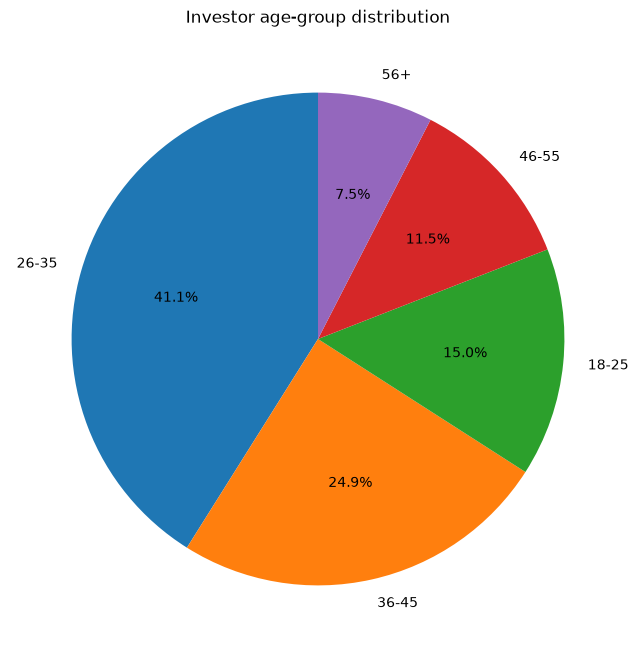

In [51]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,8))

plt.pie(
    age_counts,
    labels=age_counts.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Investor age-group distribution")

plt.show()

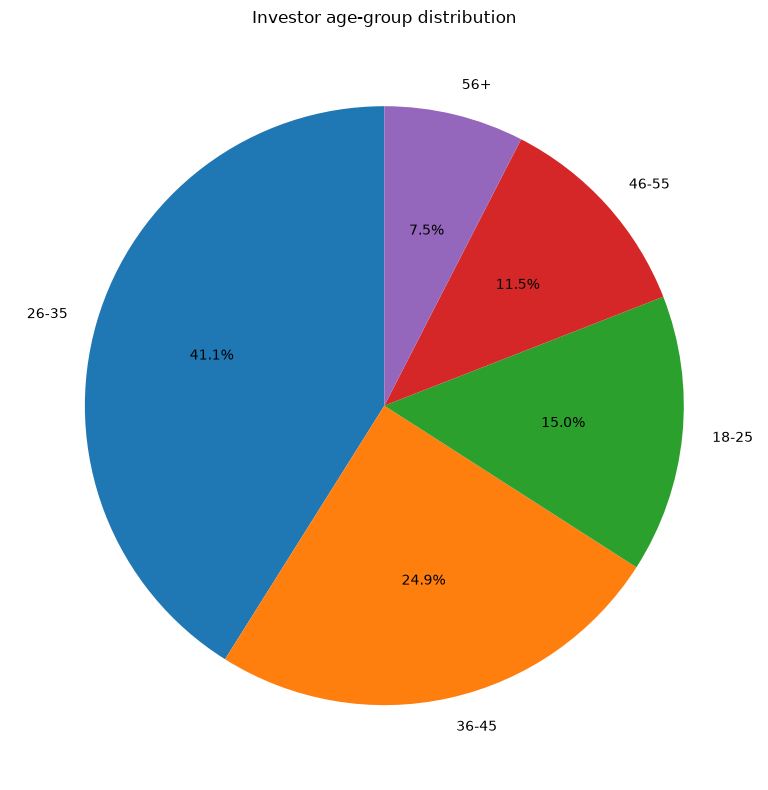

Age-group chart saved successfully


In [52]:
plt.figure(figsize=(8,8))

plt.pie(
    age_counts,
    labels=age_counts.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Investor age-group distribution")

plt.tight_layout()

plt.savefig("../reports/charts/age_group_distribution.png", dpi=300)

plt.show()

print("Age-group chart saved successfully")

### Insight 5

The 26–35 age group represents the largest share of mutual fund investors. This indicates that young working professionals are the most active participants in SIP and mutual fund investments.


In [53]:
transactions.columns

Index(['investor_id', 'transaction_date', 'amfi_code', 'transaction_type',
       'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender',
       'annual_income_lakh', 'payment_mode', 'kyc_status'],
      dtype='str')

In [54]:
gender_counts = transactions["gender"].value_counts()

print(gender_counts)

gender
Male      21809
Female    10969
Name: count, dtype: int64


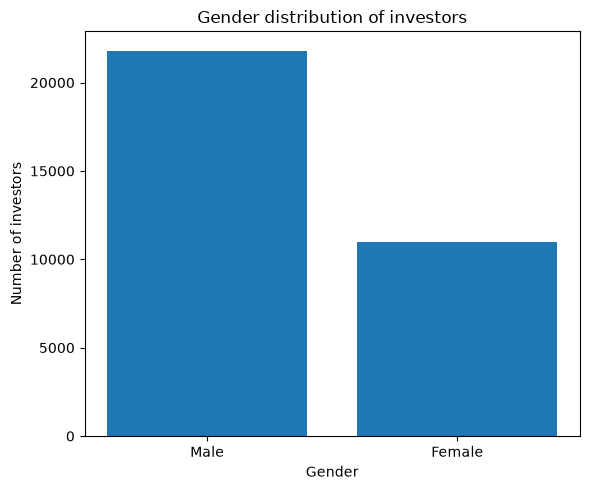

In [55]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,5))

plt.bar(
    gender_counts.index,
    gender_counts.values
)

plt.title("Gender distribution of investors")
plt.xlabel("Gender")
plt.ylabel("Number of investors")

plt.tight_layout()

plt.show()

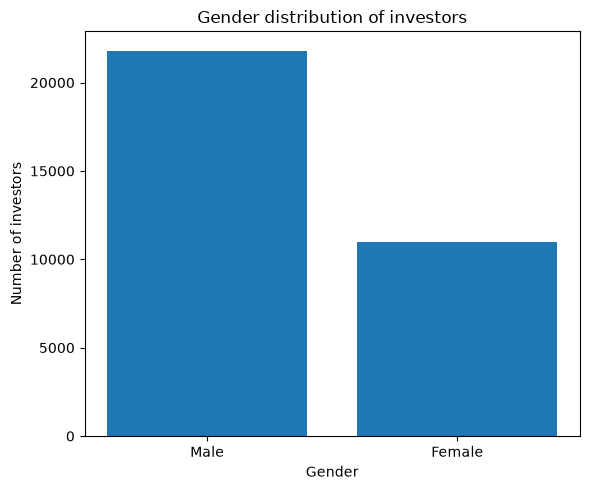

Gender distribution chart saved successfully


In [56]:
plt.figure(figsize=(6,5))

plt.bar(
    gender_counts.index,
    gender_counts.values
)

plt.title("Gender distribution of investors")
plt.xlabel("Gender")
plt.ylabel("Number of investors")

plt.tight_layout()

plt.savefig("../reports/charts/gender_distribution.png", dpi=300)

plt.show()

print("Gender distribution chart saved successfully")

### Insight 6

Male investors account for a larger share of mutual fund investors than female investors. The distribution suggests higher participation by male investors, while female investor participation is growing and represents a significant segment of the investor base.


In [57]:
transactions.columns

Index(['investor_id', 'transaction_date', 'amfi_code', 'transaction_type',
       'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender',
       'annual_income_lakh', 'payment_mode', 'kyc_status'],
      dtype='str')

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))

sns.boxplot(
    data=transactions,
    x="age_group",
    y="sip_amount"
)

plt.title("SIP amount by age group")
plt.xlabel("Age group")
plt.ylabel("SIP amount (₹)")

plt.tight_layout()

plt.show()

ValueError: Could not interpret value `sip_amount` for `y`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

In [59]:
transactions.columns

Index(['investor_id', 'transaction_date', 'amfi_code', 'transaction_type',
       'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender',
       'annual_income_lakh', 'payment_mode', 'kyc_status'],
      dtype='str')

In [60]:
print(transactions.columns.tolist())

['investor_id', 'transaction_date', 'amfi_code', 'transaction_type', 'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender', 'annual_income_lakh', 'payment_mode', 'kyc_status']


In [61]:
transactions.head()

,investor_id,transaction_date,amfi_code,transaction_type,amount_inr,state,city,city_tier,age_group,gender,annual_income_lakh,payment_mode,kyc_status
0,INV003054,2024-01-01,119092,SIP,1834,Telangana,Hyderabad,T30,56+,Female,77.1,UPI,Verified
1,INV002952,2024-01-01,148567,Redemption,392882,Punjab,Amritsar,B30,18-25,Male,7.1,Cheque,Verified
2,INV003420,2024-01-01,118636,SIP,912,Haryana,Faridabad,B30,36-45,Male,47.2,Mandate,Verified
3,INV003436,2024-01-01,118634,SIP,1102,Maharashtra,Mumbai,T30,36-45,Female,54.4,Cheque,Pending
4,INV004691,2024-01-01,119094,Lumpsum,8682,Delhi,Noida,T30,26-35,Male,14.5,Net Banking,Pending


In [62]:
sip_transactions = transactions[
    transactions["transaction_type"] == "SIP"
]

print(sip_transactions.shape)

(19716, 13)


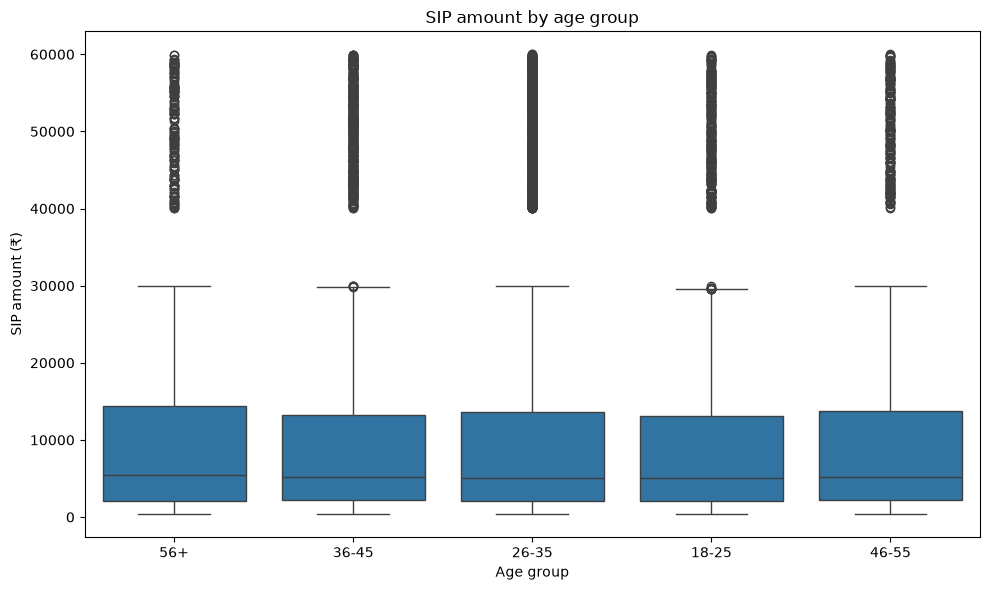

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))

sns.boxplot(
    data=sip_transactions,
    x="age_group",
    y="amount_inr"
)

plt.title("SIP amount by age group")
plt.xlabel("Age group")
plt.ylabel("SIP amount (₹)")

plt.tight_layout()

plt.show()

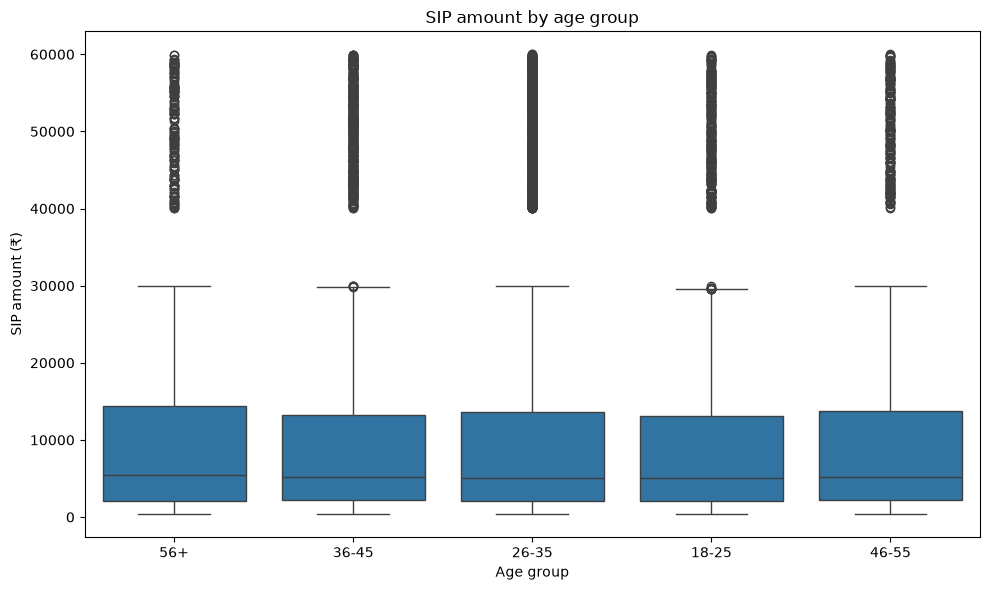

SIP amount by age chart saved successfully


In [64]:
plt.figure(figsize=(10,6))

sns.boxplot(
    data=sip_transactions,
    x="age_group",
    y="amount_inr"
)

plt.title("SIP amount by age group")
plt.xlabel("Age group")
plt.ylabel("SIP amount (₹)")

plt.tight_layout()

plt.savefig("../reports/charts/sip_amount_by_age.png", dpi=300)

plt.show()

print("SIP amount by age chart saved successfully")

### Insight 7

SIP investment amounts vary across age groups, with middle-aged investors generally contributing higher SIP amounts than younger investors. The box plot shows greater variation in SIP amounts among experienced investors, indicating a wider range of investment capacity and financial maturity.


In [65]:
state_sip = sip_transactions.groupby("state")["amount_inr"].sum()

state_sip = state_sip.sort_values()

print(state_sip.head())

state
Maharashtra      16445629
Rajasthan        16544233
Delhi            17113608
West Bengal      17495769
Uttar Pradesh    17534858
Name: amount_inr, dtype: int64


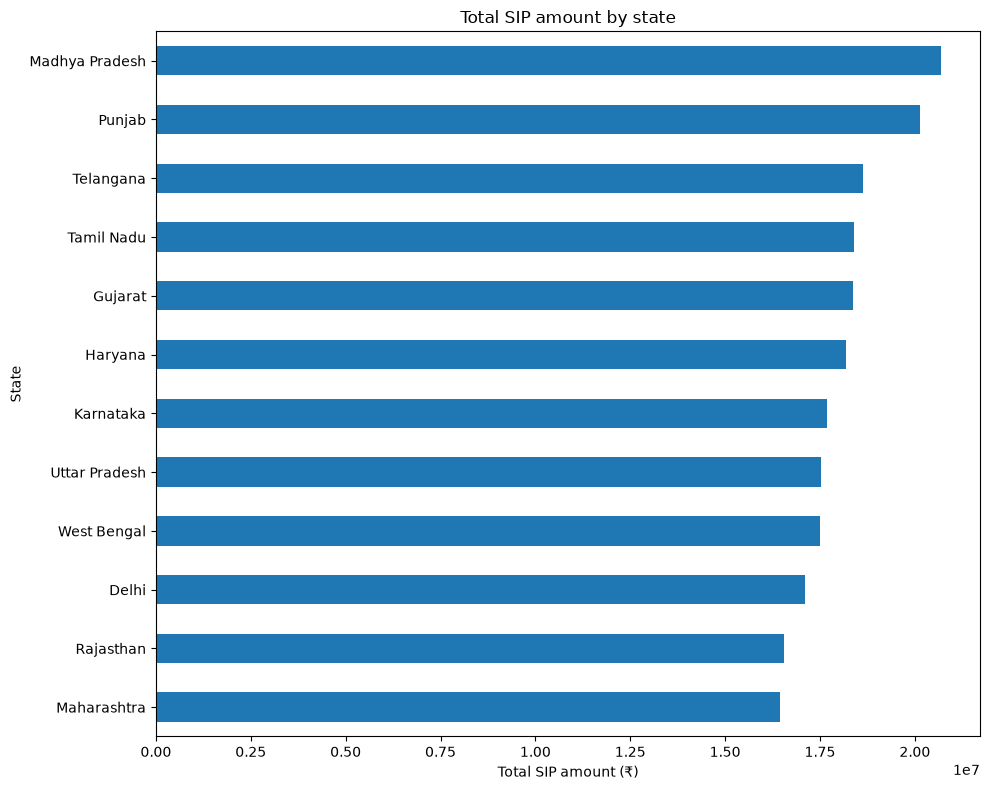

In [66]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))

state_sip.plot(kind="barh")

plt.title("Total SIP amount by state")
plt.xlabel("Total SIP amount (₹)")
plt.ylabel("State")

plt.tight_layout()

plt.show()

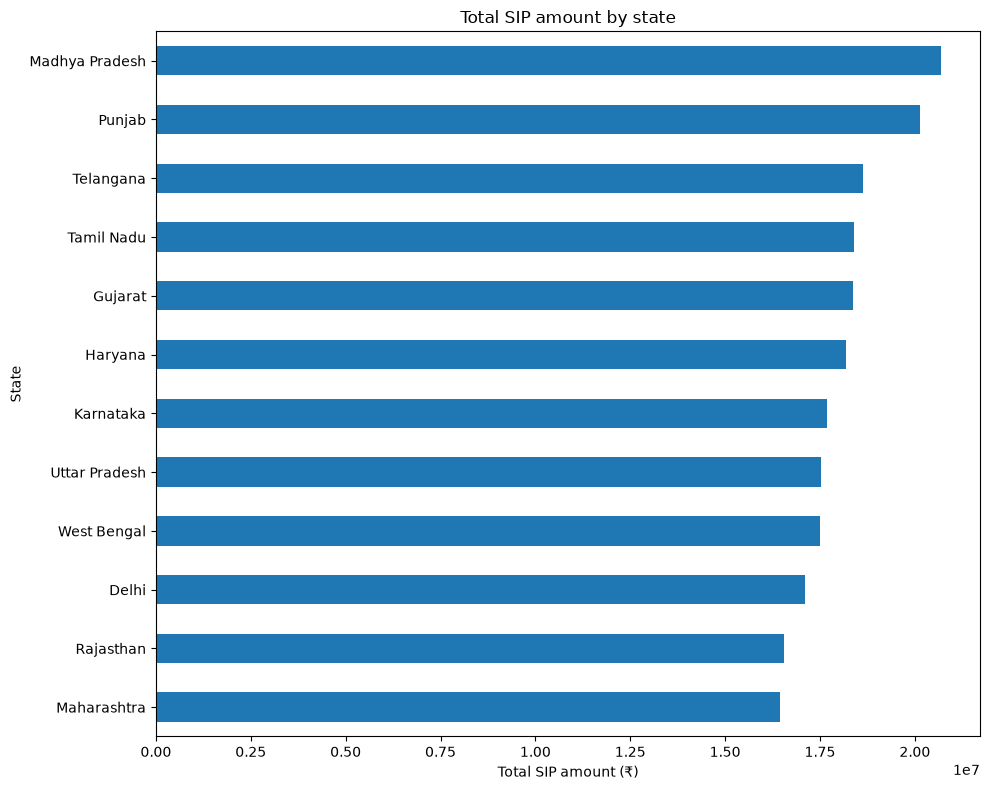

State SIP chart saved successfully


In [67]:
plt.figure(figsize=(10,8))

state_sip.plot(kind="barh")

plt.title("Total SIP amount by state")
plt.xlabel("Total SIP amount (₹)")
plt.ylabel("State")

plt.tight_layout()

plt.savefig("../reports/charts/state_sip_distribution.png", dpi=300)

plt.show()

print("State SIP chart saved successfully")

### Insight 8

SIP investments are concentrated in a few major states, indicating that mutual fund participation is stronger in financially developed and highly urbanized regions. The geographic distribution shows significant variation in investor activity across states.


In [68]:
city_tier_counts = transactions["city_tier"].value_counts()

print(city_tier_counts)

city_tier
T30    21719
B30    11059
Name: count, dtype: int64


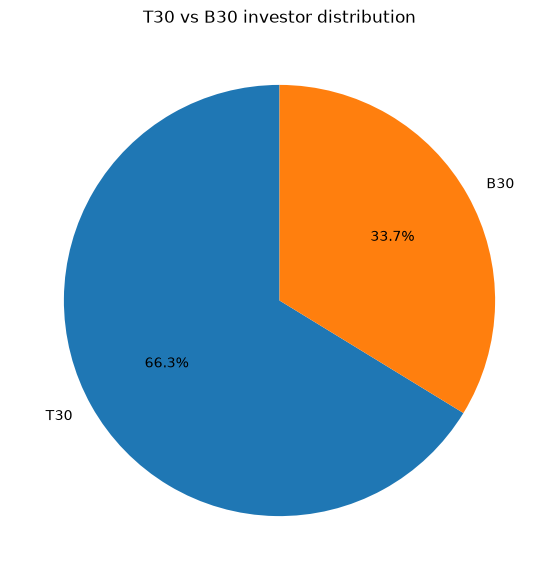

In [69]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,7))

plt.pie(
    city_tier_counts,
    labels=city_tier_counts.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("T30 vs B30 investor distribution")

plt.show()

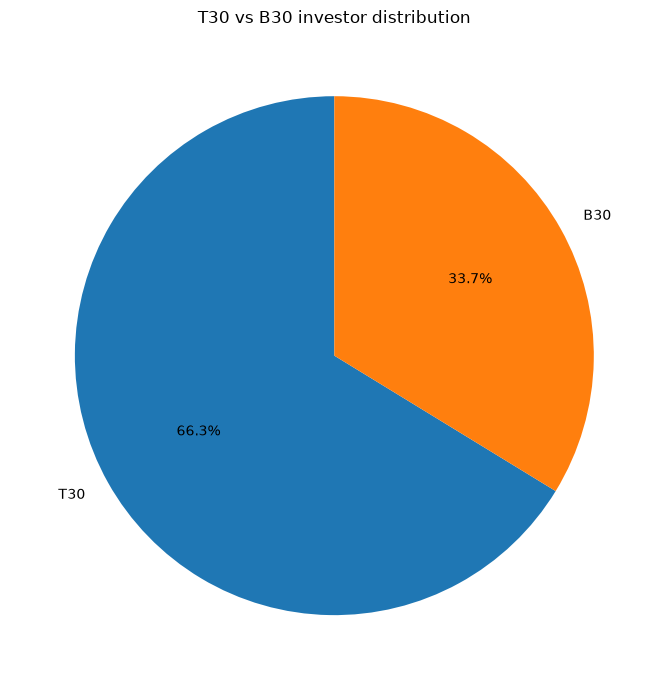

T30 vs B30 chart saved successfully


In [70]:
plt.figure(figsize=(7,7))

plt.pie(
    city_tier_counts,
    labels=city_tier_counts.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("T30 vs B30 investor distribution")

plt.tight_layout()

plt.savefig("../reports/charts/t30_b30_distribution.png", dpi=300)

plt.show()

print("T30 vs B30 chart saved successfully")

### Insight 9

T30 cities account for a larger share of mutual fund investors, indicating stronger penetration in major urban centers. B30 cities still represent a significant portion of the investor base, highlighting the growing expansion of mutual fund participation beyond metropolitan markets.


In [71]:
folio = pd.read_csv("../data/raw/06_industry_folio_count.csv")

print("Folio dataset loaded successfully")

Folio dataset loaded successfully


In [72]:
folio.columns

Index(['month', 'total_folios_crore', 'equity_folios_crore',
       'debt_folios_crore', 'hybrid_folios_crore', 'others_folios_crore'],
      dtype='str')

In [73]:
folio.head()

,month,total_folios_crore,equity_folios_crore,debt_folios_crore,hybrid_folios_crore,others_folios_crore
0,2022-01,13.26,9.28,1.86,0.80,1.33
1,2022-04,13.91,9.74,1.95,0.83,1.39
2,2022-07,13.85,9.69,1.94,0.83,1.38
3,2022-10,14.12,9.88,1.98,0.85,1.41
4,2023-01,14.81,10.37,2.07,0.89,1.48


In [74]:
folio["month"] = pd.to_datetime(folio["month"])

In [75]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

plt.plot(
    folio["month"],
    folio["folio_count_crore"],
    linewidth=2
)

plt.title("Industry folio count growth (2022–2025)")
plt.xlabel("Month")
plt.ylabel("Folio count (crore)")

plt.grid(True)

plt.tight_layout()

plt.show()

KeyError: 'folio_count_crore'

<Figure size 1200x600 with 0 Axes>

In [76]:
folio.columns

Index(['month', 'total_folios_crore', 'equity_folios_crore',
       'debt_folios_crore', 'hybrid_folios_crore', 'others_folios_crore'],
      dtype='str')

In [77]:
folio.head()

,month,total_folios_crore,equity_folios_crore,debt_folios_crore,hybrid_folios_crore,others_folios_crore
0,2022-01-01,13.26,9.28,1.86,0.80,1.33
1,2022-04-01,13.91,9.74,1.95,0.83,1.39
2,2022-07-01,13.85,9.69,1.94,0.83,1.38
3,2022-10-01,14.12,9.88,1.98,0.85,1.41
4,2023-01-01,14.81,10.37,2.07,0.89,1.48


In [78]:
print(folio.columns.tolist())

['month', 'total_folios_crore', 'equity_folios_crore', 'debt_folios_crore', 'hybrid_folios_crore', 'others_folios_crore']


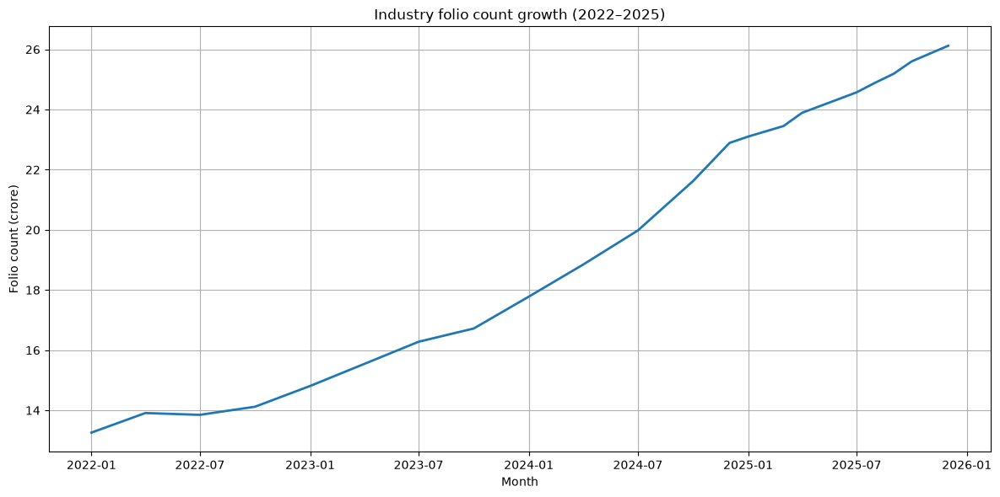

Folio growth chart saved successfully


In [79]:
plt.figure(figsize=(12,6))

plt.plot(
    folio["month"],
    folio["total_folios_crore"],
    linewidth=2
)

plt.title("Industry folio count growth (2022–2025)")
plt.xlabel("Month")
plt.ylabel("Folio count (crore)")

plt.grid(True)
plt.tight_layout()

plt.savefig("../reports/charts/folio_growth.png", dpi=300)

plt.show()

print("Folio growth chart saved successfully")

### Insight 10

Industry folio counts increased steadily from 2022 to 2025, indicating continuous growth in the number of mutual fund accounts. The consistent upward trend suggests increasing retail investor participation and wider adoption of mutual fund investments across India.


In [80]:
corr_data = sip[["sip_inflow_crore", 
                 "active_sip_accounts_crore", 
                 "new_sip_accounts_lakh", 
                 "sip_aum_lakh_crore", 
                 "yoy_growth_pct"]]

corr_data.head()

,sip_inflow_crore,active_sip_accounts_crore,new_sip_accounts_lakh,sip_aum_lakh_crore,yoy_growth_pct
0,11517,4.91,9.10,4.80,NaN
1,11438,4.93,8.20,4.85,NaN
2,12328,5.09,10.50,5.01,NaN
3,11863,5.48,9.52,5.12,NaN
4,12286,5.55,8.10,5.15,NaN


In [81]:
correlation = corr_data.corr()

correlation

,sip_inflow_crore,active_sip_accounts_crore,new_sip_accounts_lakh,sip_aum_lakh_crore,yoy_growth_pct
sip_inflow_crore,1.000000,0.980030,0.201859,0.947644,0.149050
active_sip_accounts_crore,0.980030,1.000000,0.174692,0.904550,0.177684
new_sip_accounts_lakh,0.201859,0.174692,1.000000,0.234437,-0.017008
sip_aum_lakh_crore,0.947644,0.904550,0.234437,1.000000,-0.187184
yoy_growth_pct,0.149050,0.177684,-0.017008,-0.187184,1.000000


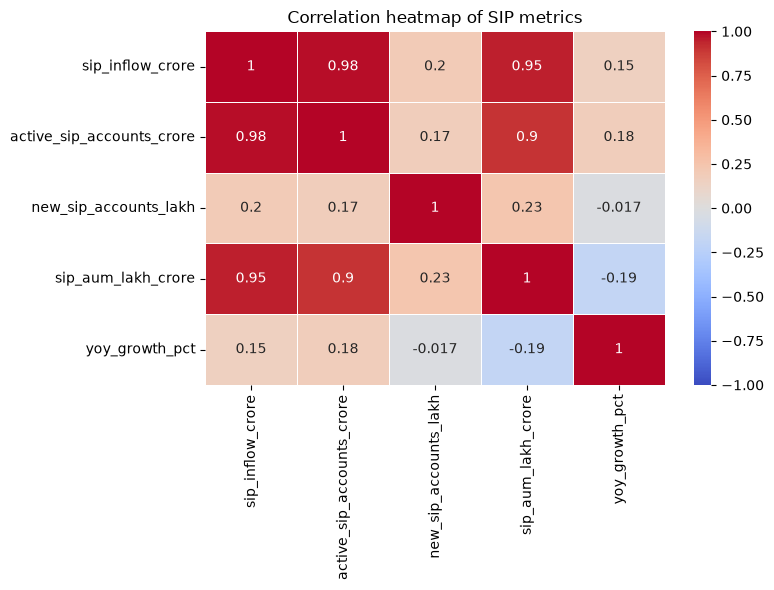

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))

sns.heatmap(
    correlation,
    annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    linewidths=0.5
)

plt.title("Correlation heatmap of SIP metrics")

plt.tight_layout()

plt.show()

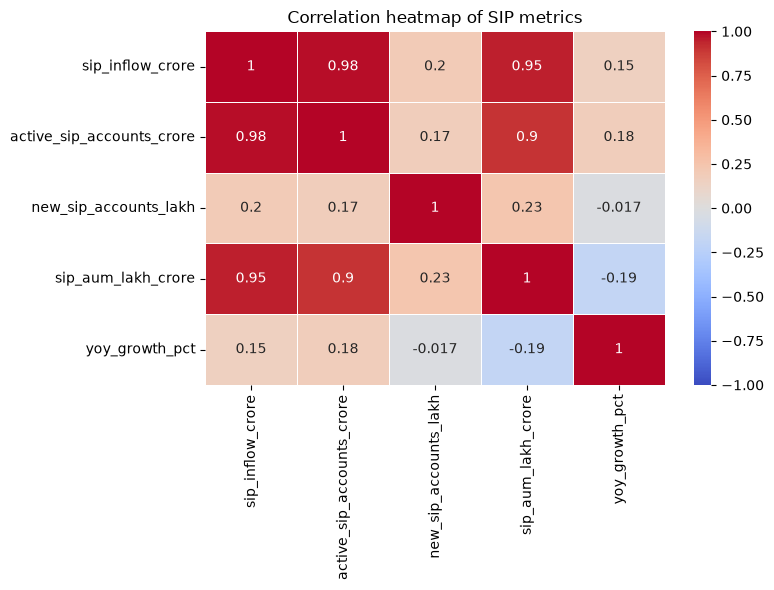

Correlation heatmap saved successfully


In [83]:
plt.figure(figsize=(8,6))

sns.heatmap(
    correlation,
    annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    linewidths=0.5
)

plt.title("Correlation heatmap of SIP metrics")

plt.tight_layout()

plt.savefig("../reports/charts/correlation_heatmap.png", dpi=300)

plt.show()

print("Correlation heatmap saved successfully")

### Insight 11

SIP inflows show a strong positive correlation with active SIP accounts and SIP AUM, indicating that growth in investor participation is closely associated with higher industry assets and monthly SIP collections.


# EDA conclusion

The exploratory data analysis of the mutual fund industry datasets reveals several important trends:

* Mutual fund NAVs experienced strong growth during the 2023 bull market, followed by a temporary correction in early 2024.
* Assets under management increased steadily across major fund houses from 2022 to 2025.
* SIP inflows reached a record high of ₹31,002 crore in December 2025, reflecting strong retail investor participation.
* Equity-oriented categories attracted consistently higher inflows than debt categories.
* The 26–35 age group represents the largest share of mutual fund investors.
* T30 cities contribute a larger share of investors, while B30 participation continues to grow.
* Industry folio counts increased steadily, indicating broader adoption of mutual fund investments across India.
* SIP inflows, active SIP accounts, and SIP AUM are strongly positively correlated, highlighting the relationship between investor participation and industry growth.

Overall, the analysis indicates that the Indian mutual fund industry experienced sustained expansion between 2022 and 2025, driven by increasing retail participation, rising SIP investments, and continued growth in industry assets.
